# Patch-level AstroCELLECT diagnostics

这个 notebook 面向已经预处理好的 HSC patch，复用训练/评测脚本中的数据加载、检测和 EX linking 后处理。主要功能：

1. 指定 patch 和 512x512 cutout 后，显示 5 个波段的 zscale 图像与预测 mask overlay，并导出自定义星等范围内的 TP/FP DS9 region 文件（无文字标注）。
2. 可视化模型 confidence map。
3. 在一个 patch 内统计指定波段（默认 HSC-I 和 HSC-Y）的分星等 completeness，输出 18-30 的条形图和 23-30 的曲线。
4. 开启 EX linking 做严格 link 诊断，随机截取 zscale 小图展示 TP 以及指定 reason 的失败案例。

In [38]:
from pathlib import Path

# -------- Data / model --------
DATA_ROOT = Path('/nvme0/zc/scarlet/preprocessed/9813')  # tract-level root; contains patch folders such as 0,0
PATCH = '0,0'
IMAGE_CACHE_DIR = Path('/nvme0/zc/scarlet/cellect_zscale_cache/9813')
CHECKPOINT = Path('output/ddp_test_b5/best.pt')
OUTPUT_DIR = Path('output/ddp_test_b5/patch_diagnostics')

# Keep this order consistent with training/checkpoint. If USE_CHECKPOINT_BANDS=True, the checkpoint order overrides this list.
BANDS = ['HSC-G', 'HSC-R', 'HSC-I', 'HSC-Z', 'HSC-Y']
USE_CHECKPOINT_BANDS = True

# Select one 512x512 tile inside the patch. Leave SAMPLE_NAME empty to use SAMPLE_INDEX.
SAMPLE_NAME = ''
SAMPLE_INDEX = 1

# -------- Inference / matching --------
DEVICE = 'cuda'  # falls back to CPU if CUDA is unavailable
FITS_HDU = 1
SOURCE_FILTER = 'nchild0'
SHAPE_SOURCE = 'sdss'
ELLIPSE_SIGMA = 3.0
CORE_RADIUS = 2
CONF_THRESHOLD = 0.0
CONFIDENCE_SCORE = 'cellect'
NMS_RADIUS = 1
CENTER_TOLERANCE_ARCSEC = 0.5
PIXEL_SCALE_ARCSEC = 0.168
MATCH_RADIUS = CENTER_TOLERANCE_ARCSEC / PIXEL_SCALE_ARCSEC
MATCHER_CANDIDATE_COUNT = 5
EX_LINK_THRESHOLD = 0.5
EN_POSTPROCESS_THRESHOLD = 0.6
USE_EN_POSTPROCESS_FOR_LINK = False

# -------- Region export --------
REGION_BANDS = ['HSC-I', 'HSC-Y']
REG_MAG_RANGE = (23.0, 30.0) # (26.5,27.5)
REGION_SIGMA = 3.0
REGION_MIN_AXIS = 1.5
REF_FLUX_COL = "base_PsfFlux_instFlux" # 'auto'
# HSC meas instFlux columns in the current preprocessed catalogs have FITS TUNIT='count'.
# For these instrumental fluxes use the HSC-style zero point 27.0.
# Only switch to 31.4 if the flux column is explicitly calibrated in nJy.
MAG_ZERO_POINT = 27.0

# -------- Magnitude completeness over the patch --------
COMPLETENESS_BANDS = ['HSC-I', 'HSC-Y']
MAG_BAR_RANGE = (18.0, 30.0)
MAG_CURVE_RANGE = (23.0, 30.0)
MAG_BIN_SIZE = 0.5
COMPLETENESS_BATCH_SIZE = 4
MAX_COMPLETENESS_RECORDS = None  # set an integer for quick checks

# -------- EX linking visualization --------
LINK_EVAL_MAX_RECORDS = 20  # set None for the whole patch; EX linking can be slow on a full patch
LINK_RANDOM_SEED = 19
LINK_CROP_SIZE = 96
LINK_CROP_DISPLAY_BAND = 'HSC-I'
LINK_CASES_PER_REASON = 2
LINK_REASON_KEYS = [
    'reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fn=-',
    'reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y',
    'reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z',
    'reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-Y|fn=-',
]

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
print('output:', OUTPUT_DIR.resolve())

output: /home/czh23/CELLECT/output/ddp_test_b5/patch_diagnostics


In [34]:
import math
import os
import random
from pathlib import Path
from collections import Counter, defaultdict
from dataclasses import replace
from typing import Dict, Iterable, List, Optional, Sequence, Tuple

import numpy as np
import torch
import torch.nn.functional as F

MPLCONFIGDIR = Path('/tmp/matplotlib-cellect')
MPLCONFIGDIR.mkdir(parents=True, exist_ok=True)
os.environ.setdefault('MPLCONFIGDIR', str(MPLCONFIGDIR))
os.environ.setdefault('MPLBACKEND', 'Agg')
import matplotlib.pyplot as plt
try:
    from IPython.display import display, Image as IPythonImage
except Exception:
    display = None
    IPythonImage = None
from matplotlib.patches import Ellipse, Rectangle
from astropy.table import Table
from astropy.visualization import ZScaleInterval
from torch.utils.data import DataLoader

from astro_cellect2d import AstroUNet2D, FusedEncoderMultiBandAstroCELLECT2D, MultiBandAstroCELLECT2D
from astro_train_data import AstroCutoutDataset, CutoutRecord, collate_cutouts, discover_cutout_records, load_catalog_ids
from astro_train_ops import (
    build_cellect_style_segmentation,
    detect_centers,
    detect_centers_with_ex_link,
    _cellect_confidence_smooth_2d,
)
from astro_magnitude_completeness import load_reference_sources, magnitude_bins, bin_rows_for_cutout, aggregate_rows


def show_saved_figure(fig, path, *, dpi: int = 180):
    """Save a matplotlib figure and display the saved PNG in notebook frontends."""
    path = Path(path)
    path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(path, dpi=dpi, bbox_inches='tight')
    plt.close(fig)
    print(f'saved: {path}')
    if display is not None and IPythonImage is not None:
        display(IPythonImage(filename=str(path)))
    return path


def choose_device(name: str) -> torch.device:
    return torch.device(name if name == 'cpu' or torch.cuda.is_available() else 'cpu')


def robust_gray(image2d, *, contrast: float = 0.25):
    """Astropy zscale normalization for display."""
    arr = np.asarray(image2d, dtype=np.float32)
    finite = np.isfinite(arr)
    if not finite.any():
        return np.zeros_like(arr, dtype=np.float32)
    safe = np.where(finite, arr, np.nanmedian(arr[finite])).astype(np.float32, copy=False)
    try:
        lo, hi = ZScaleInterval(contrast=float(contrast)).get_limits(safe[finite])
    except Exception:
        lo, hi = np.nanpercentile(safe[finite], [1, 99])
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        lo, hi = np.nanpercentile(safe[finite], [1, 99])
    if not np.isfinite(lo) or not np.isfinite(hi) or hi <= lo:
        return np.zeros_like(arr, dtype=np.float32)
    return np.clip((safe - float(lo)) / max(float(hi - lo), 1e-6), 0, 1)


def shuffled_instance_mask(mask, *, seed: int = 0):
    """Randomly remap positive instance ids for visualization."""
    mask = np.asarray(mask)
    if mask.size == 0:
        return mask.astype(np.int32, copy=False)
    max_id = int(np.nanmax(mask)) if np.isfinite(mask).any() else 0
    if max_id <= 1:
        return mask.astype(np.int32, copy=False)
    rng = np.random.default_rng(int(seed))
    lut = np.arange(max_id + 1, dtype=np.int32)
    lut[1:] = rng.permutation(lut[1:])
    safe = np.where((mask >= 0) & (mask <= max_id), mask, 0).astype(np.int32, copy=False)
    return lut[safe]


def display_xy(xy, image_height: int):
    xy = np.asarray(xy, dtype=np.float32)
    if xy.size == 0:
        return xy.reshape(0, 2)
    out = xy.copy()
    out[:, 1] = float(image_height - 1) - out[:, 1]
    return out


def band_index(bands: Sequence[str], band: str) -> int:
    query = str(band).upper()
    for idx, name in enumerate(bands):
        full = str(name).upper()
        short = full.split('-')[-1]
        if query == full or query == short:
            return idx
    raise ValueError(f'{band!r} is not in bands={list(bands)}')


def flatten_per_band_outputs(outputs: Dict[str, torch.Tensor]) -> Dict[str, torch.Tensor]:
    if outputs['seg_logits'].ndim != 5:
        return outputs
    return {k: v.reshape(v.shape[0] * v.shape[1], *v.shape[2:]) for k, v in outputs.items()}


def build_model_from_checkpoint(checkpoint_path: Path, bands: Sequence[str], device: torch.device):
    ckpt = torch.load(checkpoint_path.expanduser(), map_location=device)
    ckpt_args = ckpt.get('args', {}) if isinstance(ckpt, dict) else {}
    model_variant = ckpt.get('model_variant', ckpt_args.get('model_variant', 'fused_encoder')) if isinstance(ckpt, dict) else 'fused_encoder'
    embedding_dim = int(ckpt_args.get('embedding_dim', 64))
    base_channels = int(ckpt_args.get('base_channels', 32))
    candidate_count = int(ckpt_args.get('matcher_candidate_count', MATCHER_CANDIDATE_COUNT))
    if model_variant == 'per_band':
        model = MultiBandAstroCELLECT2D(
            num_bands=len(bands),
            seg_classes=3,
            confidence_levels=5,
            embedding_dim=embedding_dim,
            base_channels=base_channels,
            shape_channels=3,
            candidate_count=candidate_count,
            shape_feature_dim=6,
        ).to(device)
    elif model_variant == 'fused_encoder':
        model = FusedEncoderMultiBandAstroCELLECT2D(
            num_bands=len(bands),
            seg_classes=3,
            confidence_levels=5,
            embedding_dim=embedding_dim,
            base_channels=base_channels,
            shape_channels=3,
            candidate_count=candidate_count,
            shape_feature_dim=6,
        ).to(device)
    else:
        model = AstroUNet2D(
            in_channels=len(bands),
            seg_classes=3,
            confidence_levels=5,
            embedding_dim=embedding_dim,
            base_channels=base_channels,
            shape_channels=3,
        ).to(device)
    state = ckpt['model'] if isinstance(ckpt, dict) and 'model' in ckpt else ckpt
    model.load_state_dict(state)
    if isinstance(ckpt, dict) and hasattr(model, 'EX') and hasattr(model, 'EN'):
        if ckpt.get('EX') is not None:
            model.EX.load_state_dict(ckpt['EX'])
        if ckpt.get('EN') is not None:
            model.EN.load_state_dict(ckpt['EN'])
    model.eval()
    return model, ckpt


def select_patch_records(root: Path, patch: str, bands: Sequence[str]) -> List[CutoutRecord]:
    records = discover_cutout_records(root.expanduser(), bands=bands)
    patch_norm = str(patch).strip('/')
    selected = []
    for rec in records:
        aliases = {rec.patch, rec.relative_root, f'{rec.tract}/{rec.patch}' if rec.tract and rec.patch else ''}
        aliases = {item.strip('/') for item in aliases if item}
        if patch_norm in aliases:
            selected.append(rec)
    if not selected:
        raise RuntimeError(f'No records found for PATCH={patch!r} under {root}')
    return selected


def choose_record(records: Sequence[CutoutRecord], sample_name: str, sample_index: int) -> CutoutRecord:
    if sample_name:
        for rec in records:
            if sample_name in {rec.name, rec.tile_name, Path(rec.name).name}:
                return rec
        raise RuntimeError(f'SAMPLE_NAME={sample_name!r} not found. Example names: {[r.name for r in records[:5]]}')
    return records[int(sample_index)]


def make_dataset(records: Sequence[CutoutRecord]) -> AstroCutoutDataset:
    return AstroCutoutDataset(
        records,
        fits_hdu=FITS_HDU,
        confidence_levels=5,
        ellipse_sigma=ELLIPSE_SIGMA,
        core_radius=CORE_RADIUS,
        shape_source=SHAPE_SOURCE,
        source_filter=SOURCE_FILTER,
        targets_dir=None,
        image_cache_dir=IMAGE_CACHE_DIR,
        augment=False,
    )


def greedy_match_pairs(pred_xy: np.ndarray, gt_xy: np.ndarray, radius: float):
    pred_xy = np.asarray(pred_xy, dtype=np.float32).reshape(-1, 2)
    gt_xy = np.asarray(gt_xy, dtype=np.float32).reshape(-1, 2)
    pred_used = np.zeros(pred_xy.shape[0], dtype=bool)
    gt_used = np.zeros(gt_xy.shape[0], dtype=bool)
    pairs = []
    if pred_xy.size == 0 or gt_xy.size == 0:
        return pairs, pred_used, gt_used
    dist = np.sqrt(((pred_xy[:, None, :] - gt_xy[None, :, :]) ** 2).sum(axis=2))
    cand = []
    for pi in range(dist.shape[0]):
        gi = int(np.argmin(dist[pi]))
        if dist[pi, gi] <= radius:
            cand.append((float(dist[pi, gi]), pi, gi))
    for d, pi, gi in sorted(cand):
        if pred_used[pi] or gt_used[gi]:
            continue
        pred_used[pi] = True
        gt_used[gi] = True
        pairs.append((pi, gi, d))
    return pairs, pred_used, gt_used


def source_record_for_band(record: CutoutRecord, band_idx: int) -> CutoutRecord:
    meas_path = record.band_meas_paths[band_idx] if record.band_meas_paths and band_idx < len(record.band_meas_paths) else record.meas_path
    return CutoutRecord(
        name=record.name,
        image_paths=record.image_paths,
        meas_path=meas_path,
        x0=record.x0,
        y0=record.y0,
        tile_name=record.tile_name,
        tract=record.tract,
        patch=record.patch,
        relative_root=record.relative_root,
    )


def ref_for_band(record: CutoutRecord, band_idx: int, image_shape: Tuple[int, int]):
    return load_reference_sources(
        source_record_for_band(record, band_idx),
        image_shape=image_shape,
        source_filter=SOURCE_FILTER,
        flux_col=REF_FLUX_COL,
        mag_zero_point=MAG_ZERO_POINT,
        require_finite_shape=True,
    )


def sample_shape_ellipse(shape_map: np.ndarray, x: float, y: float, sigma: float = REGION_SIGMA, min_axis: float = REGION_MIN_AXIS):
    h, w = shape_map.shape[-2:]
    xi = int(round(float(x)))
    yi = int(round(float(y)))
    if xi < 0 or yi < 0 or xi >= w or yi >= h:
        return min_axis, min_axis, 0.0
    major = float(shape_map[0, yi, xi]) if shape_map.shape[0] > 0 else min_axis
    minor = float(shape_map[1, yi, xi]) if shape_map.shape[0] > 1 else major
    theta = float(shape_map[2, yi, xi]) if shape_map.shape[0] > 2 else 0.0
    if not np.isfinite(major): major = min_axis / max(sigma, 1e-6)
    if not np.isfinite(minor): minor = major
    if not np.isfinite(theta): theta = 0.0
    return max(abs(major) * sigma, min_axis), max(abs(minor) * sigma, min_axis), math.degrees(theta)


def write_ds9_ellipses(path: Path, rows: Sequence[dict], color: str):
    path.parent.mkdir(parents=True, exist_ok=True)
    with path.open('w', encoding='utf-8') as handle:
        handle.write('# Region file format: DS9 version 4.1\n')
        handle.write('global color=green dashlist=8 3 width=2 font="helvetica 14 bold roman" select=1 highlite=1 dash=0 fixed=0 edit=1 move=1 delete=1 include=1 source=1\n')
        handle.write('image\n')
        for row in rows:
            handle.write(
                f"ellipse({row['x'] + 1.0:.3f},{row['y'] + 1.0:.3f},{row['a']:.3f},{row['b']:.3f},{row['angle']:.2f}) # color={color}\n"
            )

print('helpers loaded')

helpers loaded


In [35]:
device = choose_device(DEVICE)
checkpoint_preview = torch.load(CHECKPOINT.expanduser(), map_location='cpu')
ckpt_args = checkpoint_preview.get('args', {}) if isinstance(checkpoint_preview, dict) else {}
if USE_CHECKPOINT_BANDS and isinstance(ckpt_args.get('bands'), list):
    BANDS = list(ckpt_args['bands'])
    print('Using checkpoint bands:', BANDS)
else:
    print('Using configured bands:', BANDS)

del checkpoint_preview

records = select_patch_records(DATA_ROOT, PATCH, BANDS)
record = choose_record(records, SAMPLE_NAME, SAMPLE_INDEX)
print(f'patch records: {len(records)}')
print('selected:', record.name)

model, checkpoint = build_model_from_checkpoint(CHECKPOINT, BANDS, device)
dataset = make_dataset([record])
item = dataset[0]
batch = collate_cutouts([item])
image = batch['image'].to(device=device, dtype=torch.float32)
with torch.no_grad():
    outputs = model(image)

flat_outputs = flatten_per_band_outputs(outputs)
if outputs['seg_logits'].ndim == 5:
    pred_per_band = detect_centers(flat_outputs, threshold=CONF_THRESHOLD, nms_radius=NMS_RADIUS, confidence_score=CONFIDENCE_SCORE)
    seg_instances = build_cellect_style_segmentation(flat_outputs, pred_per_band, ellipse_sigma=ELLIPSE_SIGMA)
else:
    pred_per_band = detect_centers(outputs, threshold=CONF_THRESHOLD, nms_radius=NMS_RADIUS, confidence_score=CONFIDENCE_SCORE)
    seg_instances = build_cellect_style_segmentation(outputs, pred_per_band, ellipse_sigma=ELLIPSE_SIGMA)

print('image:', tuple(batch['image'].shape), 'outputs:', {k: tuple(v.shape) for k, v in outputs.items()})
for band, pred in zip(BANDS, pred_per_band[:len(BANDS)]):
    print(f'{band}: predicted centers={len(pred)}')

Using checkpoint bands: ['HSC-G', 'HSC-R', 'HSC-I', 'HSC-Z', 'HSC-Y']
patch records: 100
selected: 0,0/grid_r00_c01_x368_y0
image: (1, 5, 512, 512) outputs: {'seg_logits': (1, 5, 3, 512, 512), 'confidence': (1, 5, 5, 512, 512), 'embedding': (1, 5, 64, 512, 512), 'shape': (1, 5, 3, 512, 512)}
HSC-G: predicted centers=349
HSC-R: predicted centers=349
HSC-I: predicted centers=349
HSC-Z: predicted centers=351
HSC-Y: predicted centers=351


## 1. 五波段 mask overlay 与 TP/FP region 导出

下面第一格显示当前 cutout 的每个波段 zscale 图像，并叠加模型预测的实例 mask。第二格会按 `REG_MAG_RANGE` 导出 DS9 region：GT region 直接来自对应波段自己的 reference catalog（例如 HSC-I 和 HSC-Y 的 GT 分开读取）；FP region 仍为未匹配预测。region 文件只写 ellipse，不写文字标注。

Current 512x512 cutout metrics:
HSC-G: GT=315 TP=288 FP=61 FN=27 completeness=0.9143 purity=0.8252
HSC-R: GT=316 TP=289 FP=60 FN=27 completeness=0.9146 purity=0.8281
HSC-I: GT=323 TP=303 FP=46 FN=20 completeness=0.9381 purity=0.8682
HSC-Z: GT=318 TP=297 FP=54 FN=21 completeness=0.9340 purity=0.8462
HSC-Y: GT=277 TP=244 FP=107 FN=33 completeness=0.8809 purity=0.6952
saved: output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_mask_overlay_metrics.png


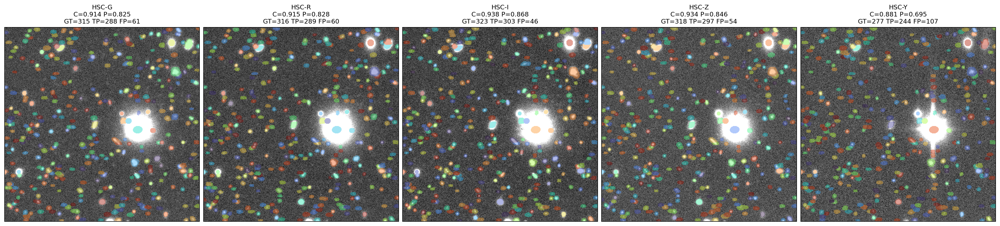

PosixPath('output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_mask_overlay_metrics.png')

In [36]:
def per_band_detection_metrics_for_sample(record: CutoutRecord, batch: dict, pred_per_band: Sequence[np.ndarray]):
    h, w = int(batch['image'].shape[-2]), int(batch['image'].shape[-1])
    rows = []
    for band_idx, band in enumerate(BANDS):
        pred_xy = np.asarray(pred_per_band[band_idx], dtype=np.float32).reshape(-1, 2)
        ref = ref_for_band(record, band_idx, (h, w))
        gt_xy = np.asarray(ref['centers'], dtype=np.float32).reshape(-1, 2)
        pairs, pred_used, gt_used = greedy_match_pairs(pred_xy, gt_xy, MATCH_RADIUS)
        tp = int(len(pairs))
        gt = int(gt_xy.shape[0])
        fp = int(pred_xy.shape[0] - tp)
        fn = int(gt - tp)
        completeness = tp / gt if gt else float('nan')
        purity = tp / (tp + fp) if (tp + fp) else float('nan')
        rows.append({
            'band': band,
            'gt': gt,
            'tp': tp,
            'fp': fp,
            'fn': fn,
            'completeness': completeness,
            'purity': purity,
        })
    return rows

sample_band_metrics = per_band_detection_metrics_for_sample(record, batch, pred_per_band)
print('Current 512x512 cutout metrics:')
for row in sample_band_metrics:
    print(
        f"{row['band']}: GT={row['gt']} TP={row['tp']} FP={row['fp']} "
        f"FN={row['fn']} completeness={row['completeness']:.4f} purity={row['purity']:.4f}"
    )

img_np = batch['image'][0].detach().cpu().numpy()
fig, axes = plt.subplots(1, len(BANDS), figsize=(4.35 * len(BANDS), 4.8), constrained_layout=True)
if len(BANDS) == 1:
    axes = [axes]
for band_idx, (band, ax) in enumerate(zip(BANDS, axes)):
    gray = robust_gray(img_np[band_idx])[::-1, :]
    raw_mask = seg_instances[band_idx]['seg_mask'] if band_idx < len(seg_instances) else np.zeros_like(img_np[band_idx], dtype=np.int32)
    mask = shuffled_instance_mask(raw_mask, seed=1000 + band_idx)[::-1, :]
    metrics = sample_band_metrics[band_idx]
    ax.imshow(gray, cmap='gray', origin='upper')
    ax.imshow(np.ma.masked_where(mask <= 0, mask), cmap='turbo', alpha=0.42, origin='upper', interpolation='nearest')
    ax.set_title(
        f"{band}\n"
        f"C={metrics['completeness']:.3f} P={metrics['purity']:.3f}\n"
        f"GT={metrics['gt']} TP={metrics['tp']} FP={metrics['fp']}",
        fontsize=10,
    )
    ax.set_xticks([]); ax.set_yticks([])
mask_overlay_path = OUTPUT_DIR / f'{record.tile_name or Path(record.name).name}_mask_overlay_metrics.png'
show_saved_figure(fig, mask_overlay_path)

In [39]:
def export_gt_fp_fn_regions_for_sample(record: CutoutRecord, batch: dict, outputs: dict, pred_per_band: Sequence[np.ndarray]):
    h, w = int(batch['image'].shape[-2]), int(batch['image'].shape[-1])
    pred_shape_np = outputs['shape'][0].detach().cpu().numpy() if outputs['shape'].ndim == 4 else outputs['shape'][0].detach().cpu().numpy()
    gt_shape_np = batch['band_shape'][0].detach().cpu().numpy()
    exported = []
    mag_lo, mag_hi = map(float, REG_MAG_RANGE)
    for band in REGION_BANDS:
        bidx = band_index(BANDS, band)
        pred_xy = np.asarray(pred_per_band[bidx], dtype=np.float32)

        # Important: load the GT catalog for this exact band. HSC-I and HSC-Y can have different filtered GT sets.
        ref = ref_for_band(record, bidx, (h, w))
        ref_xy = np.asarray(ref['centers'], dtype=np.float32)
        mag = np.asarray(ref['mag'], dtype=np.float32)
        in_mag = np.isfinite(mag) & (mag >= mag_lo) & (mag < mag_hi)

        _pairs, pred_used, gt_used = greedy_match_pairs(pred_xy, ref_xy, MATCH_RADIUS)
        band_pred_shape = pred_shape_np[bidx] if pred_shape_np.ndim == 4 else pred_shape_np
        band_gt_shape = gt_shape_np[bidx] if gt_shape_np.ndim == 4 else gt_shape_np

        gt_rows, tp_rows, fp_rows, fn_rows = [], [], [], []
        for gi in np.flatnonzero(in_mag):
            x, y = ref_xy[int(gi)]
            a, b, angle = sample_shape_ellipse(band_gt_shape, float(x), float(y))
            gt_rows.append({'x': float(x), 'y': float(y), 'a': a, 'b': b, 'angle': angle, 'mag': float(mag[int(gi)])})
        for pi in np.flatnonzero(~pred_used):
            x, y = pred_xy[int(pi)]
            a, b, angle = sample_shape_ellipse(band_pred_shape, float(x), float(y))
            fp_rows.append({'x': float(x), 'y': float(y), 'a': a, 'b': b, 'angle': angle})
        for gi in np.flatnonzero(in_mag & ~gt_used):
            x, y = ref_xy[int(gi)]
            a, b, angle = sample_shape_ellipse(band_gt_shape, float(x), float(y))
            fn_rows.append({'x': float(x), 'y': float(y), 'a': a, 'b': b, 'angle': angle, 'mag': float(mag[int(gi)])})
        for pi in np.flatnonzero(pred_used):
            x, y = pred_xy[int(pi)]
            a, b, angle = sample_shape_ellipse(band_pred_shape, float(x), float(y))
            tp_rows.append({'x': float(x), 'y': float(y), 'a': a, 'b': b, 'angle': angle})
        stem = f"{record.tile_name or Path(record.name).name}_{band}_mag{mag_lo:g}-{mag_hi:g}"
        gt_path = OUTPUT_DIR / f'{stem}_gt.reg'
        fp_path = OUTPUT_DIR / f'{stem}_fp.reg'
        fn_path = OUTPUT_DIR / f'{stem}_fn.reg'
        tp_path = OUTPUT_DIR / f'{stem}_tp.reg'
        write_ds9_ellipses(gt_path, gt_rows, color='green')
        write_ds9_ellipses(fp_path, fp_rows, color='red')
        write_ds9_ellipses(fn_path, fn_rows, color='blue')
        write_ds9_ellipses(tp_path, tp_rows, color='orange')
        exported.append({'band': band, 'gt': len(gt_rows), 'tp': len(tp_rows), 'fp': len(fp_rows), 'fn': len(fn_rows), 'gt_reg': str(gt_path), 'tp_reg': str(tp_path), 'fp_reg': str(fp_path), 'fn_reg': str(fn_path)})
    return exported

exported_regions = export_gt_fp_fn_regions_for_sample(record, batch, outputs, pred_per_band)
for row in exported_regions:
    print(row)


{'band': 'HSC-I', 'gt': 310, 'tp': 303, 'fp': 46, 'fn': 17, 'gt_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-I_mag23-30_gt.reg', 'tp_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-I_mag23-30_tp.reg', 'fp_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-I_mag23-30_fp.reg', 'fn_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-I_mag23-30_fn.reg'}
{'band': 'HSC-Y', 'gt': 252, 'tp': 244, 'fp': 107, 'fn': 25, 'gt_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-Y_mag23-30_gt.reg', 'tp_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-Y_mag23-30_tp.reg', 'fp_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-Y_mag23-30_fp.reg', 'fn_reg': 'output/ddp_test_b5/patch_diagnostics/grid_r00_c01_x368_y0_HSC-Y_mag23-30_fn.reg'}


## 2. Confidence map

第一张图显示每个波段最高 confidence channel 经过 CELLECT DK1 平滑后的 score map；第二张图显示 `CONFIDENCE_DETAIL_BAND` 的 5 个原始 ordinal confidence channel。

saved: output/ddp_test_b5/patch_diagnostics/grid_r00_c00_x0_y0_confidence_top_maps.png


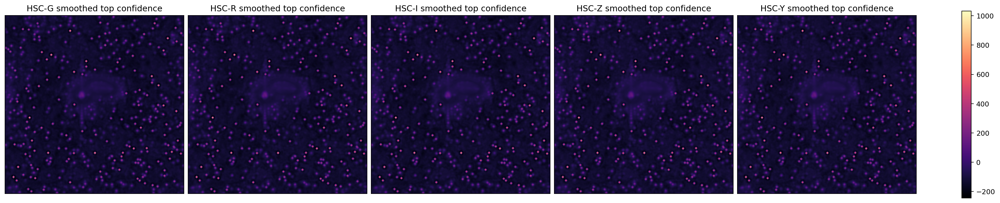

saved: output/ddp_test_b5/patch_diagnostics/grid_r00_c00_x0_y0_HSC-Y_confidence_channels.png


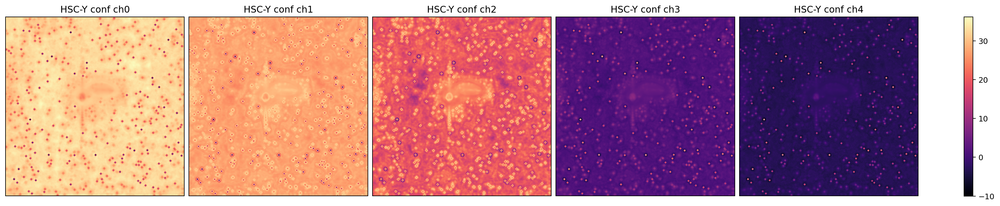

PosixPath('output/ddp_test_b5/patch_diagnostics/grid_r00_c00_x0_y0_HSC-Y_confidence_channels.png')

In [9]:
CONFIDENCE_DETAIL_BAND = 'HSC-Y'
conf = outputs['confidence']
if conf.ndim == 5:
    smoothed = _cellect_confidence_smooth_2d(flatten_per_band_outputs(outputs)['confidence']).reshape(1, len(BANDS), conf.shape[2], conf.shape[3], conf.shape[4])
    top_maps = smoothed[0, :, -1].detach().cpu().numpy()
else:
    top_maps = _cellect_confidence_smooth_2d(conf)[0, -1:].detach().cpu().numpy()

fig, axes = plt.subplots(1, len(BANDS), figsize=(4.0 * len(BANDS), 4.0), constrained_layout=True)
if len(BANDS) == 1:
    axes = [axes]
for bidx, (band, ax) in enumerate(zip(BANDS, axes)):
    im = ax.imshow(top_maps[bidx][::-1, :], cmap='magma', origin='upper')
    ax.set_title(f'{band} smoothed top confidence')
    ax.set_xticks([]); ax.set_yticks([])
fig.colorbar(im, ax=axes, fraction=0.025)
confidence_top_path = OUTPUT_DIR / f'{record.tile_name or Path(record.name).name}_confidence_top_maps.png'
show_saved_figure(fig, confidence_top_path)

bidx = band_index(BANDS, CONFIDENCE_DETAIL_BAND)
raw_conf = conf[0, bidx].detach().cpu().numpy() if conf.ndim == 5 else conf[0].detach().cpu().numpy()
fig, axes = plt.subplots(1, raw_conf.shape[0], figsize=(3.6 * raw_conf.shape[0], 3.6), constrained_layout=True)
if raw_conf.shape[0] == 1:
    axes = [axes]
for c, ax in enumerate(axes):
    im = ax.imshow(raw_conf[c][::-1, :], cmap='magma', origin='upper')
    ax.set_title(f'{CONFIDENCE_DETAIL_BAND} conf ch{c}')
    ax.set_xticks([]); ax.set_yticks([])
fig.colorbar(im, ax=axes, fraction=0.025)
confidence_channels_path = OUTPUT_DIR / f'{record.tile_name or Path(record.name).name}_{CONFIDENCE_DETAIL_BAND}_confidence_channels.png'
show_saved_figure(fig, confidence_channels_path)

## 3. Patch 内分星等 completeness

该模块遍历当前 patch 的 cutouts，对 `COMPLETENESS_BANDS` 中的每个波段分别计算预测中心与该波段 reference catalog 的一对一匹配。18-30 星等范围使用 `MAG_BIN_SIZE=0.5`：第一张图是 TP/GT 数量直方图，第二张图是 completeness 直方图；最后一张图显示 23-30 范围的 completeness 曲线。

In [10]:
def compute_patch_band_completeness(records: Sequence[CutoutRecord], bands_for_metrics: Sequence[str]):
    selected_records = list(records[:MAX_COMPLETENESS_RECORDS] if MAX_COMPLETENESS_RECORDS else records)
    loader = DataLoader(make_dataset(selected_records), batch_size=COMPLETENESS_BATCH_SIZE, shuffle=False, num_workers=0, collate_fn=collate_cutouts)
    bins = magnitude_bins(MAG_BAR_RANGE[0], MAG_BAR_RANGE[1], MAG_BIN_SIZE)
    rows = []
    with torch.no_grad():
        for batch_i, mb in enumerate(loader):
            mb_image = mb['image'].to(device=device, dtype=torch.float32)
            mb_outputs = model(mb_image)
            mb_flat = flatten_per_band_outputs(mb_outputs)
            mb_pred = detect_centers(mb_flat, threshold=CONF_THRESHOLD, nms_radius=NMS_RADIUS, confidence_score=CONFIDENCE_SCORE)
            for local_idx, name in enumerate(mb['name']):
                rec = selected_records[batch_i * COMPLETENESS_BATCH_SIZE + local_idx]
                h, w = int(mb['image'].shape[-2]), int(mb['image'].shape[-1])
                for band in bands_for_metrics:
                    bidx = band_index(BANDS, band)
                    pred_xy = mb_pred[local_idx * len(BANDS) + bidx]
                    ref = ref_for_band(rec, bidx, (h, w))
                    ref_used = np.zeros(len(ref['centers']), dtype=bool)
                    pairs, _, _ = greedy_match_pairs(pred_xy, np.asarray(ref['centers'], dtype=np.float32), MATCH_RADIUS)
                    for _, gi, _ in pairs:
                        ref_used[int(gi)] = True
                    rows.extend(bin_rows_for_cutout(
                        cutout=str(name),
                        method=band,
                        mag=np.asarray(ref['mag'], dtype=np.float32),
                        ref_used=ref_used,
                        bins=bins,
                        flux_col=str(ref['flux_col']),
                    ))
    return aggregate_rows(rows)

comp_rows = compute_patch_band_completeness(records, COMPLETENESS_BANDS)
print(f'aggregated rows: {len(comp_rows)}')
print(comp_rows[:4])

aggregated rows: 48
[{'cutout': '', 'method': 'HSC-I', 'mag_left': 18.0, 'mag_right': 18.5, 'mag_center': 18.25, 'reference_flux_col': 'base_PsfFlux_instFlux', 'reference_total': 38, 'reference_matched': 31, 'completeness': 0.8157894736842105}, {'cutout': '', 'method': 'HSC-I', 'mag_left': 18.5, 'mag_right': 19.0, 'mag_center': 18.75, 'reference_flux_col': 'base_PsfFlux_instFlux', 'reference_total': 43, 'reference_matched': 35, 'completeness': 0.813953488372093}, {'cutout': '', 'method': 'HSC-I', 'mag_left': 19.0, 'mag_right': 19.5, 'mag_center': 19.25, 'reference_flux_col': 'base_PsfFlux_instFlux', 'reference_total': 51, 'reference_matched': 37, 'completeness': 0.7254901960784313}, {'cutout': '', 'method': 'HSC-I', 'mag_left': 19.5, 'mag_right': 20.0, 'mag_center': 19.75, 'reference_flux_col': 'base_PsfFlux_instFlux', 'reference_total': 60, 'reference_matched': 49, 'completeness': 0.8166666666666667}]


saved: output/ddp_test_b5/patch_diagnostics/patch_0_0_band_tp_gt_hist_magbin0.5.png


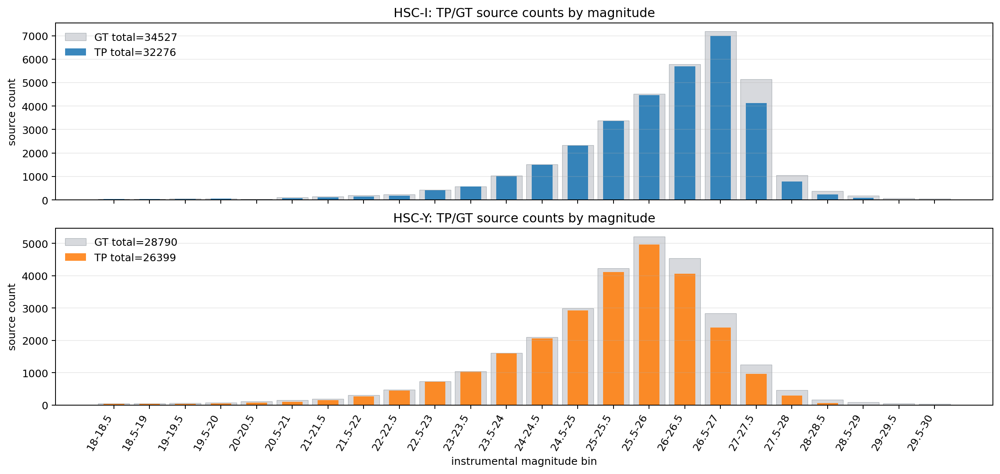

saved: output/ddp_test_b5/patch_diagnostics/patch_0_0_band_completeness_hist_magbin0.5.png


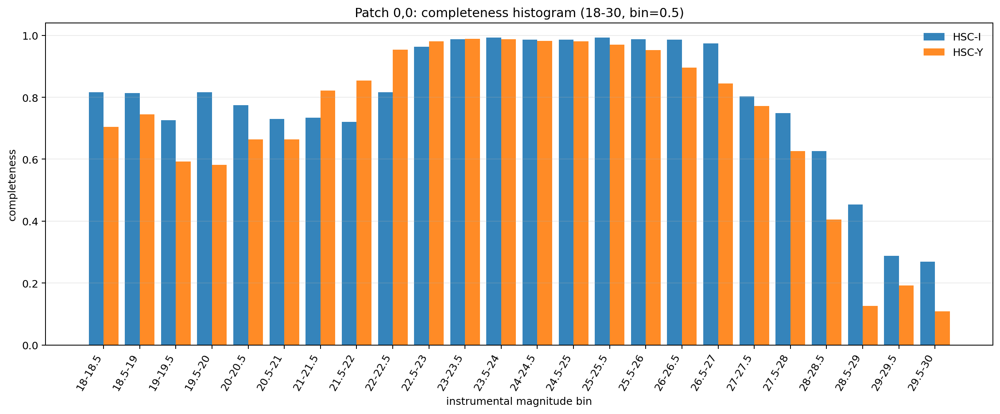

saved: output/ddp_test_b5/patch_diagnostics/patch_0_0_band_completeness_curve_magbin0.5.png


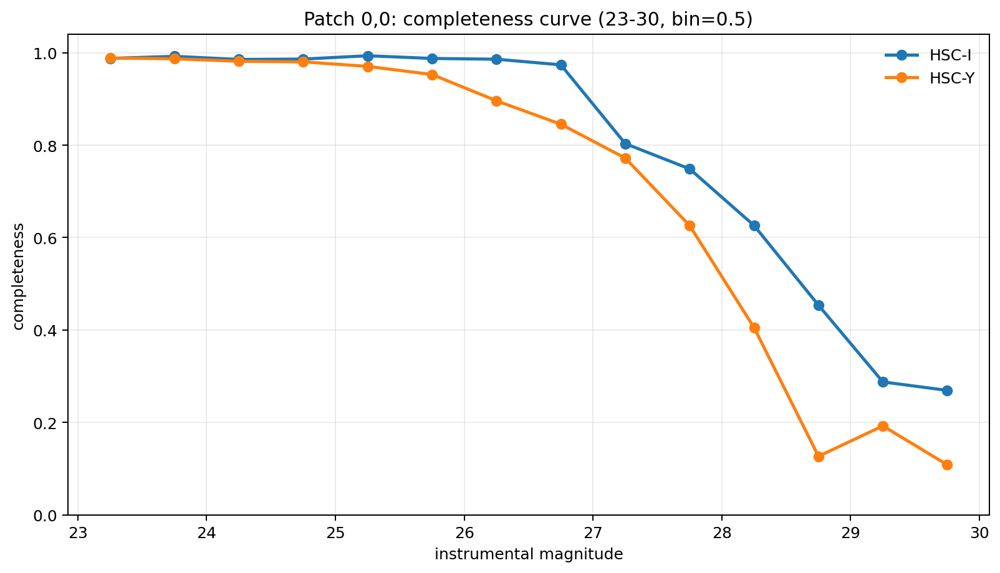

saved completeness figures: output/ddp_test_b5/patch_diagnostics/patch_0_0_band_tp_gt_hist_magbin0.5.png output/ddp_test_b5/patch_diagnostics/patch_0_0_band_completeness_hist_magbin0.5.png output/ddp_test_b5/patch_diagnostics/patch_0_0_band_completeness_curve_magbin0.5.png


In [11]:
def _row_for_bin(rows: Sequence[dict], band: str, lo: float, hi: float):
    return next(
        (
            r for r in rows
            if r['method'] == band
            and abs(float(r['mag_left']) - float(lo)) < 1e-6
            and abs(float(r['mag_right']) - float(hi)) < 1e-6
        ),
        None,
    )


def plot_completeness_bars_and_curve(rows: Sequence[dict]):
    bands_for_metrics = list(COMPLETENESS_BANDS)
    bar_rows = [r for r in rows if MAG_BAR_RANGE[0] <= float(r['mag_left']) and float(r['mag_right']) <= MAG_BAR_RANGE[1]]
    curve_rows = [r for r in rows if MAG_CURVE_RANGE[0] <= float(r['mag_left']) and float(r['mag_right']) <= MAG_CURVE_RANGE[1]]
    bins = sorted({(float(r['mag_left']), float(r['mag_right']), float(r['mag_center'])) for r in bar_rows})
    centers = np.array([center for _, _, center in bins], dtype=float)
    labels = [f'{lo:g}-{hi:g}' for lo, hi, _ in bins]
    colors = plt.rcParams['axes.prop_cycle'].by_key().get('color', ['tab:blue', 'tab:orange', 'tab:green'])

    # TP/GT source-count histogram, similar to model-output diagnostic notebooks: gray denominator with colored detected counts.
    fig, axes = plt.subplots(len(bands_for_metrics), 1, figsize=(max(12, 0.55 * len(bins)), 3.1 * len(bands_for_metrics)), sharex=True, constrained_layout=True)
    axes = np.atleast_1d(axes)
    for i, (band, ax) in enumerate(zip(bands_for_metrics, axes)):
        gt_counts = []
        tp_counts = []
        for lo, hi, _center in bins:
            row = _row_for_bin(bar_rows, band, lo, hi)
            gt_counts.append(int(row['reference_total']) if row is not None else 0)
            tp_counts.append(int(row['reference_matched']) if row is not None else 0)
        gt_total = int(np.sum(gt_counts))
        tp_total = int(np.sum(tp_counts))
        ax.bar(centers, gt_counts, width=MAG_BIN_SIZE * 0.88, color='#d7d9dd', edgecolor='#aeb3b8', linewidth=0.5, label=f'GT total={gt_total}')
        ax.bar(centers, tp_counts, width=MAG_BIN_SIZE * 0.58, color=colors[i % len(colors)], alpha=0.88, label=f'TP total={tp_total}')
        ax.set_title(f'{band}: TP/GT source counts by magnitude')
        ax.set_ylabel('source count')
        ax.grid(axis='y', alpha=0.25)
        ax.legend(frameon=False, loc='upper left')
    axes[-1].set_xlabel('instrumental magnitude bin')
    axes[-1].set_xticks(centers)
    axes[-1].set_xticklabels(labels, rotation=60, ha='right')
    count_path = OUTPUT_DIR / f'patch_{PATCH.replace(",", "_")}_band_tp_gt_hist_magbin{MAG_BIN_SIZE:g}.png'
    show_saved_figure(fig, count_path)

    # Completeness histogram with the same 0.5-mag bins.
    x = np.arange(len(bins), dtype=float)
    width = 0.82 / max(len(bands_for_metrics), 1)
    fig, ax = plt.subplots(figsize=(max(12, 0.55 * len(bins)), 5.4), constrained_layout=True)
    for i, band in enumerate(bands_for_metrics):
        vals = []
        for lo, hi, _center in bins:
            row = _row_for_bin(bar_rows, band, lo, hi)
            vals.append(float(row['completeness']) if row is not None else np.nan)
        ax.bar(x + (i - (len(bands_for_metrics) - 1) / 2) * width, vals, width=width, label=band, color=colors[i % len(colors)], alpha=0.9)
    ax.set_title(f'Patch {PATCH}: completeness histogram ({MAG_BAR_RANGE[0]:g}-{MAG_BAR_RANGE[1]:g}, bin={MAG_BIN_SIZE:g})')
    ax.set_xlabel('instrumental magnitude bin')
    ax.set_ylabel('completeness')
    ax.set_ylim(0, 1.04)
    ax.set_xticks(x)
    ax.set_xticklabels(labels, rotation=60, ha='right')
    ax.grid(axis='y', alpha=0.25)
    ax.legend(frameon=False)
    bar_path = OUTPUT_DIR / f'patch_{PATCH.replace(",", "_")}_band_completeness_hist_magbin{MAG_BIN_SIZE:g}.png'
    show_saved_figure(fig, bar_path)

    fig, ax = plt.subplots(figsize=(8.8, 5.0), constrained_layout=True)
    for i, band in enumerate(bands_for_metrics):
        band_rows = sorted([r for r in curve_rows if r['method'] == band], key=lambda r: float(r['mag_center']))
        ax.plot([r['mag_center'] for r in band_rows], [r['completeness'] for r in band_rows], marker='o', linewidth=2, label=band, color=colors[i % len(colors)])
    ax.set_title(f'Patch {PATCH}: completeness curve ({MAG_CURVE_RANGE[0]:g}-{MAG_CURVE_RANGE[1]:g}, bin={MAG_BIN_SIZE:g})')
    ax.set_xlabel('instrumental magnitude')
    ax.set_ylabel('completeness')
    ax.set_ylim(0, 1.04)
    ax.grid(alpha=0.25)
    ax.legend(frameon=False)
    curve_path = OUTPUT_DIR / f'patch_{PATCH.replace(",", "_")}_band_completeness_curve_magbin{MAG_BIN_SIZE:g}.png'
    show_saved_figure(fig, curve_path)
    print('saved completeness figures:', count_path, bar_path, curve_path)

plot_completeness_bars_and_curve(comp_rows)

## 4. EX linking 诊断与小图随机可视化

该模块开启 EX linking，按严格 link_metrics 口径对组件分层。`link_rows` 中每一行都有 `reason_key`、中心坐标、成员波段和匹配到的 source id。最后一格会从 512x512 zscale 图中截取小块，随机展示 TP 和指定四类 reason。

In [22]:
def _band_label(idx: int) -> str:
    return BANDS[int(idx)] if 0 <= int(idx) < len(BANDS) else f'band{idx}'


def _format_band_set(indices: Iterable[int]) -> str:
    vals = sorted({int(x) for x in indices})
    return ','.join(_band_label(x) for x in vals) if vals else '-'


def nearest_gt_id(center_xy, gt_centers: torch.Tensor, gt_ids: torch.Tensor, radius: float):
    if gt_centers.numel() == 0 or gt_ids.numel() == 0:
        return None
    centers = gt_centers.detach().cpu().numpy().astype(np.float32)
    ids = gt_ids.detach().cpu().numpy().astype(np.int64)
    dist = np.sqrt(((centers[:, :2] - np.asarray(center_xy, dtype=np.float32)[None, :2]) ** 2).sum(axis=1))
    best = int(np.argmin(dist))
    return int(ids[best]) if float(dist[best]) <= float(radius) else None


def classify_link_components_detailed(components, batch_item: dict, image_np: np.ndarray, record_name: str):
    band_centers = batch_item['band_centers'][0]
    band_ids = batch_item['band_ids'][0]
    merged_centers = batch_item['centers'][0]
    merged_ids = batch_item['ids'][0]
    band_rejected_ids = batch_item.get('band_rejected_ids', [[]])[0]

    filtered_bands_by_id = defaultdict(set)
    for bidx, ids in enumerate(band_ids):
        for sid in ids.detach().cpu().numpy().astype(np.int64):
            filtered_bands_by_id[int(sid)].add(int(bidx))

    rejected = set()
    for ids in band_rejected_ids:
        if isinstance(ids, torch.Tensor) and ids.numel():
            rejected.update(int(x) for x in ids.detach().cpu().numpy().astype(np.int64))

    gt_bands_by_id = {}
    for sid in merged_ids.detach().cpu().numpy().astype(np.int64):
        sid = int(sid)
        if sid in rejected:
            continue
        bands = filtered_bands_by_id.get(sid, set())
        if bands:
            gt_bands_by_id[sid] = set(bands)

    id_to_center = {
        int(sid): merged_centers[i].detach().cpu().numpy().astype(np.float32)
        for i, sid in enumerate(merged_ids.detach().cpu().numpy().astype(np.int64))
    }

    rows = []
    matched_gt_ids = set()
    for comp_idx, comp in enumerate(components):
        member_centers = comp.get('member_centers') or []
        member_bands = set()
        matched_by_id = defaultdict(set)
        for item in member_centers:
            if not isinstance(item, (list, tuple)) or len(item) < 2:
                continue
            bidx = int(item[0])
            xy = item[1]
            member_bands.add(bidx)
            if xy is None:
                continue
            mid = nearest_gt_id(xy, merged_centers, merged_ids, MATCH_RADIUS)
            if mid is not None and mid in gt_bands_by_id:
                matched_by_id[mid].add(bidx)
        center = np.asarray(comp.get('center', [np.nan, np.nan]), dtype=np.float32)
        if not np.isfinite(center).all() and member_centers:
            pts = [np.asarray(item[1], dtype=np.float32) for item in member_centers if isinstance(item, (list, tuple)) and len(item) >= 2 and item[1] is not None]
            center = np.mean(pts, axis=0) if pts else np.array([np.nan, np.nan], dtype=np.float32)

        if not member_bands:
            reason = 'empty_component'; matched_bands = set(); fp_bands = set(); fn_bands = set(); source_id = None
        elif not matched_by_id:
            reason = 'no_member_matches_gt'; matched_bands = set(); fp_bands = set(member_bands); fn_bands = set(); source_id = None
        else:
            source_id, matched_bands = max(matched_by_id.items(), key=lambda kv: (len(kv[1]), -int(kv[0])))
            gt_bands = gt_bands_by_id.get(int(source_id), set())
            fn_bands = set(gt_bands) - set(matched_bands)
            fp_bands = (set(member_bands) - set(matched_bands)) | (set(member_bands) - set(gt_bands))
            complete = bool(gt_bands) and set(member_bands) == set(gt_bands) and set(matched_bands) == set(gt_bands)
            if complete and int(source_id) not in matched_gt_ids:
                matched_gt_ids.add(int(source_id))
                rows.append({
                    'kind': 'tp', 'reason': 'complete_match', 'reason_key': 'tp_complete',
                    'record': record_name, 'component_index': comp_idx, 'source_id': int(source_id),
                    'center': center, 'gt_center': id_to_center.get(int(source_id), center), 'fp_center': np.array([np.nan, np.nan], dtype=np.float32),
                    'member_centers': member_centers,
                    'member_bands': set(member_bands), 'matched_bands': set(matched_bands), 'fp_bands': set(), 'fn_bands': set(),
                })
                continue
            if complete:
                reason = 'duplicate_complete_match'
            elif len(matched_by_id) > 1:
                reason = 'mixed_source_ids'
            elif fp_bands and fn_bands:
                reason = 'wrong_and_missing_bands'
            elif fp_bands:
                reason = 'extra_or_wrong_bands'
            elif fn_bands:
                reason = 'missing_bands'
            else:
                reason = 'incomplete_match'
        key = f'reason={reason}|matched={_format_band_set(matched_bands)}|fp={_format_band_set(fp_bands)}|fn={_format_band_set(fn_bands)}'
        rows.append({
            'kind': 'fp', 'reason': reason, 'reason_key': key,
            'record': record_name, 'component_index': comp_idx, 'source_id': int(source_id) if source_id is not None else None,
            'center': center,
            'gt_center': id_to_center.get(int(source_id), np.array([np.nan, np.nan], dtype=np.float32)) if source_id is not None else np.array([np.nan, np.nan], dtype=np.float32),
            'fp_center': center,
            'member_centers': member_centers,
            'member_bands': set(member_bands), 'matched_bands': set(matched_bands), 'fp_bands': set(fp_bands), 'fn_bands': set(fn_bands),
        })

    for sid in sorted(set(gt_bands_by_id) - matched_gt_ids):
        fn_bands = gt_bands_by_id[sid]
        key = f'reason=unmatched_gt_source|matched=-|fp=-|fn={_format_band_set(fn_bands)}'
        rows.append({
            'kind': 'fn', 'reason': 'unmatched_gt_source', 'reason_key': key,
            'record': record_name, 'component_index': None, 'source_id': int(sid),
            'center': id_to_center.get(int(sid), np.array([np.nan, np.nan], dtype=np.float32)),
            'gt_center': id_to_center.get(int(sid), np.array([np.nan, np.nan], dtype=np.float32)),
            'fp_center': np.array([np.nan, np.nan], dtype=np.float32),
            'member_centers': [], 'member_bands': set(), 'matched_bands': set(), 'fp_bands': set(), 'fn_bands': set(fn_bands),
        })
    return rows


def run_ex_link_diagnostics(records: Sequence[CutoutRecord]):
    selected = list(records[:LINK_EVAL_MAX_RECORDS] if LINK_EVAL_MAX_RECORDS else records)
    ds = make_dataset(selected)
    rows = []
    images_by_record = {}
    shapes_by_record = {}
    gt_shapes_by_record = {}
    gt_centers_by_record = {}
    gt_seg_by_record = {}
    pred_seg_by_record = {}
    with torch.no_grad():
        for rec, item in zip(selected, ds):
            mb = collate_cutouts([item])
            mb_image = mb['image'].to(device=device, dtype=torch.float32)
            mb_outputs = model(mb_image)
            pred_linked, components_all = detect_centers_with_ex_link(
                model,
                mb_outputs,
                threshold=CONF_THRESHOLD,
                nms_radius=NMS_RADIUS,
                confidence_score=CONFIDENCE_SCORE,
                match_radius=MATCH_RADIUS,
                candidate_count=MATCHER_CANDIDATE_COUNT,
                ex_threshold=EX_LINK_THRESHOLD,
                use_en_postprocess=USE_EN_POSTPROCESS_FOR_LINK,
                en_threshold=EN_POSTPROCESS_THRESHOLD,
            )
            images_by_record[rec.name] = mb['image'][0].detach().cpu().numpy()
            shapes_by_record[rec.name] = mb_outputs['shape'][0].detach().cpu().numpy() if mb_outputs['shape'].ndim == 5 else mb_outputs['shape'].detach().cpu().numpy()
            gt_shapes_by_record[rec.name] = mb['band_shape'][0].detach().cpu().numpy()
            gt_centers_by_record[rec.name] = [v.detach().cpu().numpy().astype(np.float32).reshape(-1, v.shape[-1])[:, :2] for v in mb['band_centers'][0]]
            gt_seg_by_record[rec.name] = mb['band_seg'][0].detach().cpu().numpy()
            pred_seg_by_record[rec.name] = mb_outputs['seg_logits'][0].argmax(dim=1).detach().cpu().numpy() if mb_outputs['seg_logits'].ndim == 5 else mb_outputs['seg_logits'][0].argmax(dim=0, keepdims=True).detach().cpu().numpy()
            components = components_all[0] if components_all else []
            rows.extend(classify_link_components_detailed(components, mb, images_by_record[rec.name], rec.name))
    return rows, images_by_record, shapes_by_record, gt_shapes_by_record, gt_centers_by_record, gt_seg_by_record, pred_seg_by_record

link_rows, link_images, link_shapes, link_gt_shapes, link_gt_centers, link_gt_seg, link_pred_seg = run_ex_link_diagnostics(records)
counts = Counter(row['reason_key'] for row in link_rows)
print('rows:', len(link_rows))
print('top reasons:')
for key, count in counts.most_common(20):
    print(count, key)

rows: 7713
top reasons:
4240 tp_complete
2260 reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fn=-
202 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z
174 reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-Y|fn=-
173 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y
68 reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z|fn=-
51 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-R,HSC-I,HSC-Z,HSC-Y
48 reason=no_member_matches_gt|matched=-|fp=HSC-Y|fn=-
45 reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-G|fn=-
23 reason=no_member_matches_gt|matched=-|fp=HSC-I|fn=-
22 reason=no_member_matches_gt|matched=-|fp=HSC-G|fn=-
21 reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Y|fn=-
21 reason=no_member_matches_gt|matched=-|fp=HSC-I,HSC-Z|fn=-
19 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-I,HSC-Z,HSC-Y
18 reason=no_member_matches_gt|matched=-|fp

In [23]:
from collections import Counter

kind_counts = Counter(row["kind"] for row in link_rows)
reason_counts = Counter(row["reason_key"] for row in link_rows)

tp = kind_counts.get("tp", 0)
fp = kind_counts.get("fp", 0)
fn = kind_counts.get("fn", 0)

print("link TP/FP/FN")
print("TP:", tp)
print("FP:", fp)
print("FN:", fn)
print("purity:", tp / max(tp + fp, 1))
print("completeness:", tp / max(tp + fn, 1))

print("\nTop reasons:")
for key, count in reason_counts.most_common(30):
    print(count, key)

link TP/FP/FN
TP: 4240
FP: 2965
FN: 508
purity: 0.5884802220680083
completeness: 0.8930075821398483

Top reasons:
4240 tp_complete
2260 reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fn=-
202 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z
174 reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-Y|fn=-
173 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y
68 reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z|fn=-
51 reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-R,HSC-I,HSC-Z,HSC-Y
48 reason=no_member_matches_gt|matched=-|fp=HSC-Y|fn=-
45 reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-G|fn=-
23 reason=no_member_matches_gt|matched=-|fp=HSC-I|fn=-
22 reason=no_member_matches_gt|matched=-|fp=HSC-G|fn=-
21 reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Y|fn=-
21 reason=no_member_matches_gt|matched=-|fp=HSC-I,HSC-Z|fn=-
19 reason=unmatched_gt_so

no_member_matches_gt_false_source_shape: selected 2 / 2074
unmatched_gt_all5_fn_shape: selected 2 / 137
unmatched_gt_griz_fn_shape: selected 2 / 187
extra_y_fp_gt_compare_shape: selected 2 / 167
example 1: reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fn=- record=0,0/grid_r01_c00_x0_y368 source_id=None
  HSC-G GT_SDSS= None pred_shape= [(2.5892672538757324, 1.508212685585022, -0.09072330594062805)]
  HSC-R GT_SDSS= None pred_shape= [(2.462454319000244, 1.5301538705825806, -0.08211661875247955)]
  HSC-I GT_SDSS= None pred_shape= [(2.454794406890869, 1.5342206954956055, -0.08212798833847046)]
  HSC-Z GT_SDSS= None pred_shape= [(2.460574150085449, 1.5316822528839111, -0.08198213577270508)]
  HSC-Y GT_SDSS= None pred_shape= [(2.587908983230591, 1.5108168125152588, -0.09074428677558899)]
example 2: reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fn=- record=0,0/grid_r01_c07_x2576_y368 source_id=None
  HSC-G GT_SDSS= None pred_shape= [(2.340663

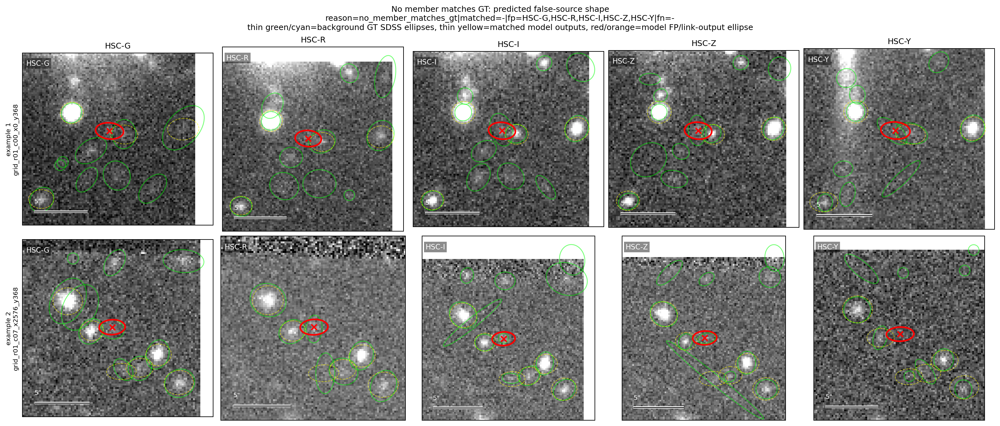

example 1: reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y record=0,0/grid_r00_c09_x3588_y0 source_id=43158030413463897
  HSC-G GT_SDSS= (3.55857515335083, 2.336993932723999, 0.409146249294281) pred_shape= []
  HSC-R GT_SDSS= (2.0499634742736816, 1.0, -1.0404527187347412) pred_shape= []
  HSC-I GT_SDSS= (6.275134563446045, 4.9635396003723145, -1.473442554473877) pred_shape= []
  HSC-Z GT_SDSS= (5.705417633056641, 1.0, 1.0486681461334229) pred_shape= []
  HSC-Y GT_SDSS= (1.0, 1.0, 0.0) pred_shape= []
example 2: reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y record=0,0/grid_r00_c00_x0_y0 source_id=43158030413484348
  HSC-G GT_SDSS= (4.69450044631958, 3.9228224754333496, -0.41056114435195923) pred_shape= []
  HSC-R GT_SDSS= (5.280027389526367, 3.3760287761688232, -0.4666270315647125) pred_shape= []
  HSC-I GT_SDSS= (4.854262351989746, 3.1389830112457275, 1.003307819366455) pred_shape= []
  HSC-Z GT_SDSS= (5.211510181427002, 3.59969329

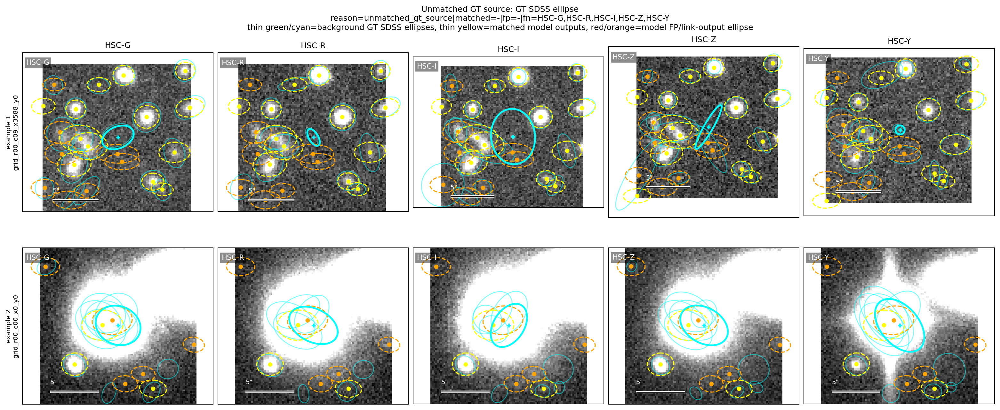

example 1: reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z record=0,0/grid_r01_c01_x368_y368 source_id=43158030413487141
  HSC-G GT_SDSS= (2.702510356903076, 2.2444591522216797, 1.1720751523971558) pred_shape= []
  HSC-R GT_SDSS= (2.7477734088897705, 1.4023536443710327, -1.366843819618225) pred_shape= []
  HSC-I GT_SDSS= (2.8701117038726807, 1.0150259733200073, 0.956299901008606) pred_shape= []
  HSC-Z GT_SDSS= (5.433401107788086, 2.1820929050445557, -1.2874263525009155) pred_shape= []
example 2: reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z record=0,0/grid_r01_c03_x1104_y368 source_id=43158030413465642
  HSC-G GT_SDSS= (3.2756872177124023, 2.619832754135132, 0.5946481227874756) pred_shape= []
  HSC-R GT_SDSS= (3.089163064956665, 2.422744035720825, 0.9875378012657166) pred_shape= []
  HSC-I GT_SDSS= (7.788497447967529, 1.655303716659546, 0.19650141894817352) pred_shape= []
  HSC-Z GT_SDSS= (3.54673171043396, 1.0, 1.0643928050994873) pred_shap

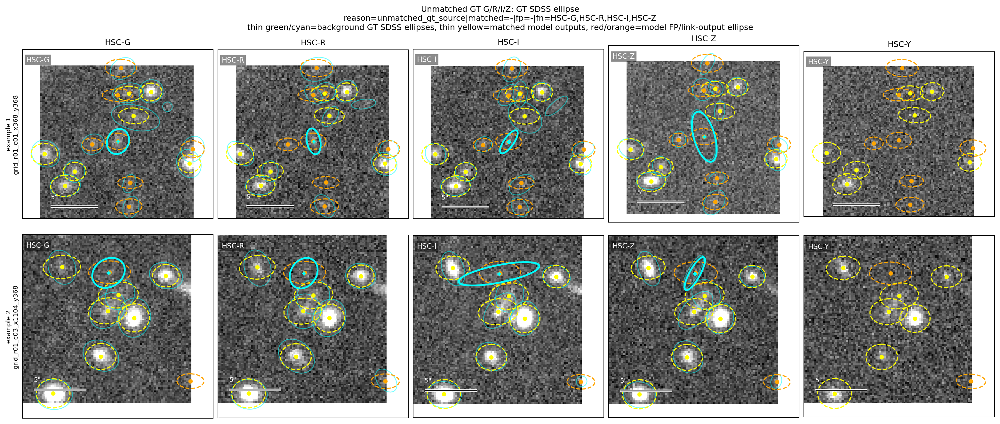

example 1: reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-Y|fn=- record=0,0/grid_r00_c05_x1840_y0 source_id=43158030413484720
  HSC-G GT_SDSS= (2.1781740188598633, 1.7467923164367676, 1.4491664171218872) pred_shape= [(2.6919071674346924, 1.6093024015426636, -0.018314063549041748)]
  HSC-R GT_SDSS= (2.556168794631958, 1.0978788137435913, -1.539595127105713) pred_shape= [(2.6731252670288086, 1.611802339553833, -0.015512675046920776)]
  HSC-I GT_SDSS= (2.8005731105804443, 1.7408242225646973, -0.23750458657741547) pred_shape= [(2.7266767024993896, 1.5979881286621094, -0.023290380835533142)]
  HSC-Z GT_SDSS= (1.8956701755523682, 1.0, 0.9294014573097229) pred_shape= [(2.7037479877471924, 1.6060709953308105, -0.020316898822784424)]
  HSC-Y GT_SDSS= None pred_shape= [(2.824347496032715, 1.6034950017929077, -0.035921044647693634)]
example 2: reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-Y|fn=- record=0,0/grid_r01_c04_x1472_y368 source_id=4315

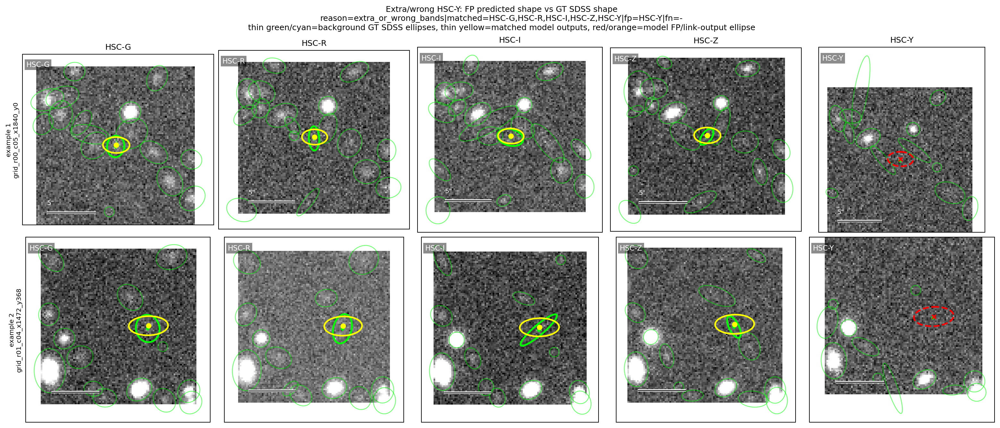

saved link shape example figures:
output/ddp_test_b5/patch_diagnostics/patch_0_0_no_member_matches_gt_false_source_shape_five_band_shape_examples.png
output/ddp_test_b5/patch_diagnostics/patch_0_0_unmatched_gt_all5_fn_shape_five_band_shape_examples.png
output/ddp_test_b5/patch_diagnostics/patch_0_0_unmatched_gt_griz_fn_shape_five_band_shape_examples.png
output/ddp_test_b5/patch_diagnostics/patch_0_0_extra_y_fp_gt_compare_shape_five_band_shape_examples.png


In [29]:
def crop_bounds(center_xy, h: int, w: int, size: int):
    cx, cy = map(float, center_xy[:2])
    half = int(size) // 2
    x0 = int(round(cx)) - half
    y0 = int(round(cy)) - half
    x0 = max(0, min(w - size, x0)) if w >= size else 0
    y0 = max(0, min(h - size, y0)) if h >= size else 0
    x1 = min(w, x0 + size)
    y1 = min(h, y0 + size)
    return x0, x1, y0, y1


def finite_xy(value):
    xy = np.asarray(value, dtype=np.float32).reshape(-1)
    if xy.size < 2 or not np.isfinite(xy[:2]).all():
        return None
    return xy[:2]


def row_visual_center(row):
    points = []
    for key in ('gt_center', 'fp_center', 'center'):
        xy = finite_xy(row.get(key, [np.nan, np.nan]))
        if xy is not None:
            points.append(xy)
    for item in row.get('member_centers', []):
        if isinstance(item, (list, tuple)) and len(item) >= 2:
            xy = finite_xy(item[1])
            if xy is not None:
                points.append(xy)
    if not points:
        return None
    return np.mean(np.stack(points, axis=0), axis=0).astype(np.float32)


def row_is_crop_friendly(row, images_by_record, margin=8):
    img = images_by_record.get(row['record'])
    center = row_visual_center(row)
    if img is None or center is None:
        return False
    h, w = img.shape[-2:]
    x, y = center[:2]
    return margin <= x < (w - margin) and margin <= y < (h - margin)


def add_scale_bar(ax, crop_shape, *, arcsec: float = 5.0):
    h, w = crop_shape[:2]
    length_px = max(6.0, min(float(w) * 0.45, float(arcsec) / max(float(PIXEL_SCALE_ARCSEC), 1e-6)))
    x0 = 6.0
    y0 = float(h) - 8.0
    ax.plot([x0, x0 + length_px], [y0, y0], color='white', linewidth=3, solid_capstyle='butt')
    ax.plot([x0, x0 + length_px], [y0, y0], color='black', linewidth=1, solid_capstyle='butt')
    ax.text(x0, y0 - 4.0, f'{arcsec:g}"', color='white', fontsize=8, ha='left', va='bottom')


def member_centers_by_band(row, band_idx: int):
    out = []
    for item in row.get('member_centers', []):
        if isinstance(item, (list, tuple)) and len(item) >= 2 and int(item[0]) == int(band_idx):
            xy = finite_xy(item[1])
            if xy is not None:
                out.append(xy)
    return out


def linked_member_centers_in_crop(record_name: str, band_idx: int, x0: int, x1: int, y0: int, y1: int, *, exclude_row=None):
    """All linked model-output member centers in this crop for one band."""
    out = []
    for other in globals().get('link_rows', []):
        if other is exclude_row or other.get('record') != record_name:
            continue
        for xy in member_centers_by_band(other, band_idx):
            if float(x0) <= float(xy[0]) < float(x1) and float(y0) <= float(xy[1]) < float(y1):
                out.append((xy, other.get('reason_key', ''), other.get('kind', '')))
    return out


def draw_nearby_link_outputs(ax, row, band_idx: int, x0: int, x1: int, y0: int, y1: int, crop_h: int):
    """Overlay model linked outputs near an unmatched GT source."""
    record_name = row['record']
    pred_shape = link_shapes.get(record_name)
    if pred_shape is None or band_idx >= len(pred_shape):
        return
    centers = linked_member_centers_in_crop(record_name, band_idx, x0, x1, y0, y1, exclude_row=row)
    for xy, reason_key, kind in centers:
        color = 'yellow' if kind == 'tp' else 'orange'
        draw_shape_ellipse(ax, xy, pred_shape[band_idx], x0, y0, crop_h, color=color, linewidth=1.35, linestyle='--')
        draw_center(ax, xy, x0, y0, crop_h, marker='o', color=color, size=18, linewidth=1.2)


def draw_matched_link_outputs(ax, row, band_idx: int, x0: int, x1: int, y0: int, y1: int, crop_h: int):
    """Overlay already matched model outputs in this crop as thin ellipses."""
    record_name = row['record']
    pred_shape = link_shapes.get(record_name)
    if pred_shape is None or band_idx >= len(pred_shape):
        return
    centers = linked_member_centers_in_crop(record_name, band_idx, x0, x1, y0, y1, exclude_row=row)
    for xy, reason_key, kind in centers:
        if kind != 'tp':
            continue
        draw_shape_ellipse(
            ax, xy, pred_shape[band_idx], x0, y0, crop_h,
            color='yellow', linewidth=0.75, linestyle='--', alpha=0.65,
        )


def _center_array(value):
    if isinstance(value, torch.Tensor):
        arr = value.detach().cpu().numpy()
    else:
        arr = np.asarray(value)
    arr = np.asarray(arr, dtype=np.float32)
    if arr.size == 0:
        return np.zeros((0, 2), dtype=np.float32)
    return arr.reshape(-1, arr.shape[-1])[:, :2]


def draw_gt_context_ellipses(ax, row, band_idx: int, x0: int, x1: int, y0: int, y1: int, crop_h: int, *, color='cyan', focus_xy=None):
    """Draw thin SDSS ellipses for all GT sources in the current crop."""
    record_name = row['record']
    gt_shape = link_gt_shapes.get(record_name)
    centers_by_band = globals().get('link_gt_centers', {}).get(record_name)
    if gt_shape is None or centers_by_band is None or band_idx >= len(gt_shape) or band_idx >= len(centers_by_band):
        return
    centers = _center_array(centers_by_band[band_idx])
    if centers.size == 0:
        return
    focus = finite_xy(focus_xy)
    for xy in centers:
        if not (float(x0) <= float(xy[0]) < float(x1) and float(y0) <= float(xy[1]) < float(y1)):
            continue
        if focus is not None and np.linalg.norm(np.asarray(xy[:2], dtype=np.float32) - focus) < 1.0:
            continue
        draw_shape_ellipse(
            ax, xy, gt_shape[band_idx], x0, y0, crop_h,
            color=color, linewidth=1, alpha=0.55, sigma=ELLIPSE_SIGMA,
        )


def _shape_at_xy(shape_map, xy):
    xy = finite_xy(xy)
    if xy is None:
        return None
    arr = np.asarray(shape_map, dtype=np.float32)
    if arr.ndim != 3 or arr.shape[0] < 2:
        return None
    h, w = arr.shape[-2:]
    x = int(round(float(xy[0])))
    y = int(round(float(xy[1])))
    if x < 0 or y < 0 or x >= w or y >= h:
        return None
    major = float(arr[0, y, x])
    minor = float(arr[1, y, x])
    theta = float(arr[2, y, x]) if arr.shape[0] > 2 else 0.0
    if not np.isfinite(major) or not np.isfinite(minor) or major <= 0 or minor <= 0:
        return None
    return major, minor, theta


def draw_shape_ellipse(ax, xy, shape_map, x0, y0, crop_h, *, color, linestyle='-', linewidth=1.8, sigma=None, label=None, alpha=1.0):
    xy = finite_xy(xy)
    params = _shape_at_xy(shape_map, xy) if xy is not None else None
    if xy is None or params is None:
        return None
    major, minor, theta = params
    scale = float(ELLIPSE_SIGMA if sigma is None else sigma)
    px = float(xy[0]) - float(x0)
    py = float(crop_h - 1) - (float(xy[1]) - float(y0))
    ell = Ellipse(
        (px, py),
        width=2.0 * max(abs(major) * scale, 1.5),
        height=2.0 * max(abs(minor) * scale, 1.5),
        angle=-math.degrees(theta),
        fill=False,
        edgecolor=color,
        linestyle=linestyle,
        linewidth=linewidth,
        label=label,
        alpha=alpha,
    )
    ax.add_patch(ell)
    return major, minor, theta


def draw_center(ax, xy, x0, y0, crop_h, *, marker, color, size=52, linewidth=1.8):
    xy = finite_xy(xy)
    if xy is None:
        return
    px = float(xy[0]) - float(x0)
    py = float(crop_h - 1) - (float(xy[1]) - float(y0))
    ax.scatter([px], [py], marker=marker, s=size, c=color, linewidths=linewidth)


def draw_seg_contour(ax, seg_map, x0, x1, y0, y1, *, color, linewidth=1.0, linestyle='-'):
    if seg_map is None:
        return
    mask = np.asarray(seg_map[y0:y1, x0:x1] > 0, dtype=np.float32)[::-1, :]
    if mask.size == 0 or mask.max() <= 0:
        return
    ax.contour(mask, levels=[0.5], colors=[color], linewidths=linewidth, linestyles=linestyle)


def ensure_link_shape_context(rows):
    """Populate shape/segmentation/GT-center caches without rerunning EX linking if needed."""
    global link_shapes, link_gt_shapes, link_gt_seg, link_pred_seg, link_images, link_gt_centers
    link_shapes = globals().get('link_shapes', {})
    link_gt_shapes = globals().get('link_gt_shapes', {})
    link_gt_seg = globals().get('link_gt_seg', {})
    link_pred_seg = globals().get('link_pred_seg', {})
    link_images = globals().get('link_images', {})
    link_gt_centers = globals().get('link_gt_centers', {})
    needed = sorted({row['record'] for row in rows if row.get('record') not in link_shapes or row.get('record') not in link_gt_centers})
    if not needed:
        return
    record_by_name = {rec.name: rec for rec in records}
    selected_records = [record_by_name[name] for name in needed if name in record_by_name]
    if not selected_records:
        return
    ds = make_dataset(selected_records)
    with torch.no_grad():
        for rec, item in zip(selected_records, ds):
            mb = collate_cutouts([item])
            mb_image = mb['image'].to(device=device, dtype=torch.float32)
            mb_outputs = model(mb_image)
            link_images[rec.name] = mb['image'][0].detach().cpu().numpy()
            link_shapes[rec.name] = mb_outputs['shape'][0].detach().cpu().numpy() if mb_outputs['shape'].ndim == 5 else mb_outputs['shape'].detach().cpu().numpy()
            link_gt_shapes[rec.name] = mb['band_shape'][0].detach().cpu().numpy()
            link_gt_centers[rec.name] = [_center_array(v) for v in mb['band_centers'][0]]
            link_gt_seg[rec.name] = mb['band_seg'][0].detach().cpu().numpy()
            link_pred_seg[rec.name] = mb_outputs['seg_logits'][0].argmax(dim=1).detach().cpu().numpy() if mb_outputs['seg_logits'].ndim == 5 else mb_outputs['seg_logits'][0].argmax(dim=0, keepdims=True).detach().cpu().numpy()


LINK_VISUALIZATION_SPECS = [
    {
        'name': 'no_member_matches_gt_false_source_shape',
        'reason_key': 'reason=no_member_matches_gt|matched=-|fp=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fn=-',
        'mode': 'false_source',
        'title': 'No member matches GT: predicted false-source shape',
    },
    {
        'name': 'unmatched_gt_all5_fn_shape',
        'reason_key': 'reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y',
        'mode': 'fn_only',
        'title': 'Unmatched GT source: GT SDSS ellipse',
    },
    {
        'name': 'unmatched_gt_griz_fn_shape',
        'reason_key': 'reason=unmatched_gt_source|matched=-|fp=-|fn=HSC-G,HSC-R,HSC-I,HSC-Z',
        'mode': 'fn_only',
        'title': 'Unmatched GT G/R/I/Z: GT SDSS ellipse',
    },
    {
        'name': 'extra_y_fp_gt_compare_shape',
        'reason_key': 'reason=extra_or_wrong_bands|matched=HSC-G,HSC-R,HSC-I,HSC-Z,HSC-Y|fp=HSC-Y|fn=-',
        'mode': 'fp_gt_compare',
        'title': 'Extra/wrong HSC-Y: FP predicted shape vs GT SDSS shape',
    },
]


def sample_rows_by_reason(rows, images_by_record):
    rng = random.Random(LINK_RANDOM_SEED)
    selected = {}
    for spec in LINK_VISUALIZATION_SPECS:
        candidates = [
            row for row in rows
            if row.get('reason_key') == spec['reason_key'] and row_is_crop_friendly(row, images_by_record)
        ]
        rng.shuffle(candidates)
        selected[spec['name']] = candidates[:LINK_CASES_PER_REASON]
        if not candidates:
            print('no examples:', spec['reason_key'])
        else:
            print(f"{spec['name']}: selected {len(selected[spec['name']])} / {len(candidates)}")
    return selected


def draw_case_shapes(ax, row, band_idx: int, x0: int, x1: int, y0: int, y1: int, crop_h: int, mode: str):
    record_name = row['record']
    pred_shape = link_shapes.get(record_name)
    gt_shape = link_gt_shapes.get(record_name)
    gt_seg = link_gt_seg.get(record_name)
    pred_seg = link_pred_seg.get(record_name)
    focus_gt_xy = row.get('gt_center', row.get('center'))

    if mode == 'false_source':
        # Thin green ellipses are all GT SDSS shapes; thin yellow dashed ellipses are matched model outputs; red ellipses are model false linked members.
        draw_gt_context_ellipses(ax, row, band_idx, x0, x1, y0, y1, crop_h, color='lime', focus_xy=None)
        draw_matched_link_outputs(ax, row, band_idx, x0, x1, y0, y1, crop_h)
        for xy in member_centers_by_band(row, band_idx):
            if pred_shape is not None and band_idx < len(pred_shape):
                draw_shape_ellipse(ax, xy, pred_shape[band_idx], x0, y0, crop_h, color='red', linewidth=2.0)
            draw_center(ax, xy, x0, y0, crop_h, marker='x', color='red', size=48)
    elif mode == 'fn_only':
        # Thin cyan ellipses are all GT SDSS shapes in the crop; thick cyan is the target FN source.
        # Yellow/orange dashed ellipses are nearby linked model outputs inside the same crop.
        if band_idx in row.get('fn_bands', set()):
            draw_gt_context_ellipses(ax, row, band_idx, x0, x1, y0, y1, crop_h, color='cyan', focus_xy=focus_gt_xy)
        draw_nearby_link_outputs(ax, row, band_idx, x0, x1, y0, y1, crop_h)
        if band_idx in row.get('fn_bands', set()):
            if gt_shape is not None and band_idx < len(gt_shape):
                draw_shape_ellipse(ax, row.get('gt_center', row.get('center')), gt_shape[band_idx], x0, y0, crop_h, color='cyan', linewidth=2.2)
            draw_center(ax, row.get('gt_center', row.get('center')), x0, y0, crop_h, marker='+', color='cyan', size=24, linewidth=2.0)
    elif mode == 'fp_gt_compare':
        # Thin green ellipses are all GT SDSS shapes in the crop; thick green is the matched GT source.
        # Red is extra FP predicted shape; yellow is matched predicted shape.
        draw_gt_context_ellipses(ax, row, band_idx, x0, x1, y0, y1, crop_h, color='lime', focus_xy=row.get('gt_center'))
        if gt_shape is not None and band_idx < len(gt_shape):
            draw_shape_ellipse(ax, row.get('gt_center'), gt_shape[band_idx], x0, y0, crop_h, color='lime', linewidth=2.2)
        draw_center(ax, row.get('gt_center'), x0, y0, crop_h, marker='+', color='lime', size=24, linewidth=2.0)
        for xy in member_centers_by_band(row, band_idx):
            color = 'red' if band_idx in row.get('fp_bands', set()) else 'yellow'
            if pred_shape is not None and band_idx < len(pred_shape):
                draw_shape_ellipse(ax, xy, pred_shape[band_idx], x0, y0, crop_h, color=color, linewidth=2.0, linestyle='--' if color == 'red' else '-')
            draw_center(ax, xy, x0, y0, crop_h, marker='x' if color == 'red' else 'o', color=color, size=24)

    ax.text(0.02, 0.96, _band_label(band_idx), transform=ax.transAxes, color='white', fontsize=9, ha='left', va='top',
            bbox=dict(facecolor='black', alpha=0.45, edgecolor='none', pad=2))


def print_shape_summary(rows):
    for idx, row in enumerate(rows[:LINK_CASES_PER_REASON], start=1):
        print(f"example {idx}: {row['reason_key']} record={row['record']} source_id={row.get('source_id')}")
        for band_idx, band in enumerate(BANDS):
            gt_params = None
            pred_params = []
            if row.get('gt_center') is not None and row['record'] in link_gt_shapes and band_idx < len(link_gt_shapes[row['record']]):
                gt_params = _shape_at_xy(link_gt_shapes[row['record']][band_idx], row.get('gt_center'))
            if row['record'] in link_shapes and band_idx < len(link_shapes[row['record']]):
                for xy in member_centers_by_band(row, band_idx):
                    pred_params.append(_shape_at_xy(link_shapes[row['record']][band_idx], xy))
            if gt_params is not None or any(p is not None for p in pred_params):
                print(' ', band, 'GT_SDSS=', gt_params, 'pred_shape=', [p for p in pred_params if p is not None])


def plot_reason_examples(spec, rows, images_by_record):
    if not rows:
        return None
    ensure_link_shape_context(rows)
    print_shape_summary(rows)
    n_examples = min(len(rows), LINK_CASES_PER_REASON)
    ncols = len(BANDS)
    fig, axes = plt.subplots(n_examples, ncols, figsize=(3.45 * ncols, 3.65 * n_examples), squeeze=False, constrained_layout=True)
    for row_idx, row in enumerate(rows[:n_examples]):
        img = images_by_record[row['record']]
        h, w = img.shape[-2:]
        center = row_visual_center(row)
        x0, x1, y0, y1 = crop_bounds(center, h, w, LINK_CROP_SIZE)
        crop_h = y1 - y0
        for band_idx, band in enumerate(BANDS):
            ax = axes[row_idx, band_idx]
            crop = robust_gray(img[band_idx, y0:y1, x0:x1])[::-1, :]
            ax.imshow(crop, cmap='gray', origin='upper')
            draw_case_shapes(ax, row, band_idx, x0, x1, y0, y1, crop_h, spec['mode'])
            add_scale_bar(ax, crop.shape, arcsec=5.0)
            if row_idx == 0:
                ax.set_title(band, fontsize=10)
            ax.set_xticks([]); ax.set_yticks([])
        axes[row_idx, 0].set_ylabel(f"example {row_idx + 1}\n{Path(row['record']).name}", fontsize=8)
    fig.suptitle(f"{spec['title']}\n{spec['reason_key']}\nthin green/cyan=background GT SDSS ellipses, thin yellow=matched model outputs, red/orange=model FP/link-output ellipse", fontsize=10)
    out_path = OUTPUT_DIR / f"patch_{PATCH.replace(',', '_')}_{spec['name']}_five_band_shape_examples.png"
    show_saved_figure(fig, out_path)
    return out_path


selected_link_rows_by_reason = sample_rows_by_reason(link_rows, link_images)
link_shape_example_paths = []
for spec in LINK_VISUALIZATION_SPECS:
    path = plot_reason_examples(spec, selected_link_rows_by_reason.get(spec['name'], []), link_images)
    if path is not None:
        link_shape_example_paths.append(path)
print('saved link shape example figures:')
for path in link_shape_example_paths:
    print(path)